# Week 3: the modifiable areal unit problem (MAUP), change over time

In [1]:
!pip -q install maup census

In [2]:
%config InlineBackend.figure_formats = ["retina"]

import matplotlib.pyplot as plt
import maup
import pandas as pd
import geopandas as gpd

from math import isnan
from census import Census
from collections import Counter

## Introduction to Census blocks

In [3]:
state_fips = "36"    # New York
county_fips = "109"
county_name = "Tompkins County"  # contains Ithaca

In [4]:
census = Census("", year=2020)

In [5]:
block_gdf = gpd.read_file(f"https://www2.census.gov/geo/tiger/TIGER2024/TABBLOCK20/tl_2024_{state_fips}_tabblock20.zip")
block_gdf = block_gdf.to_crs("EPSG:2263").set_index("GEOID20")

In [6]:
county_block_gdf = block_gdf[block_gdf.COUNTYFP20 == county_fips]

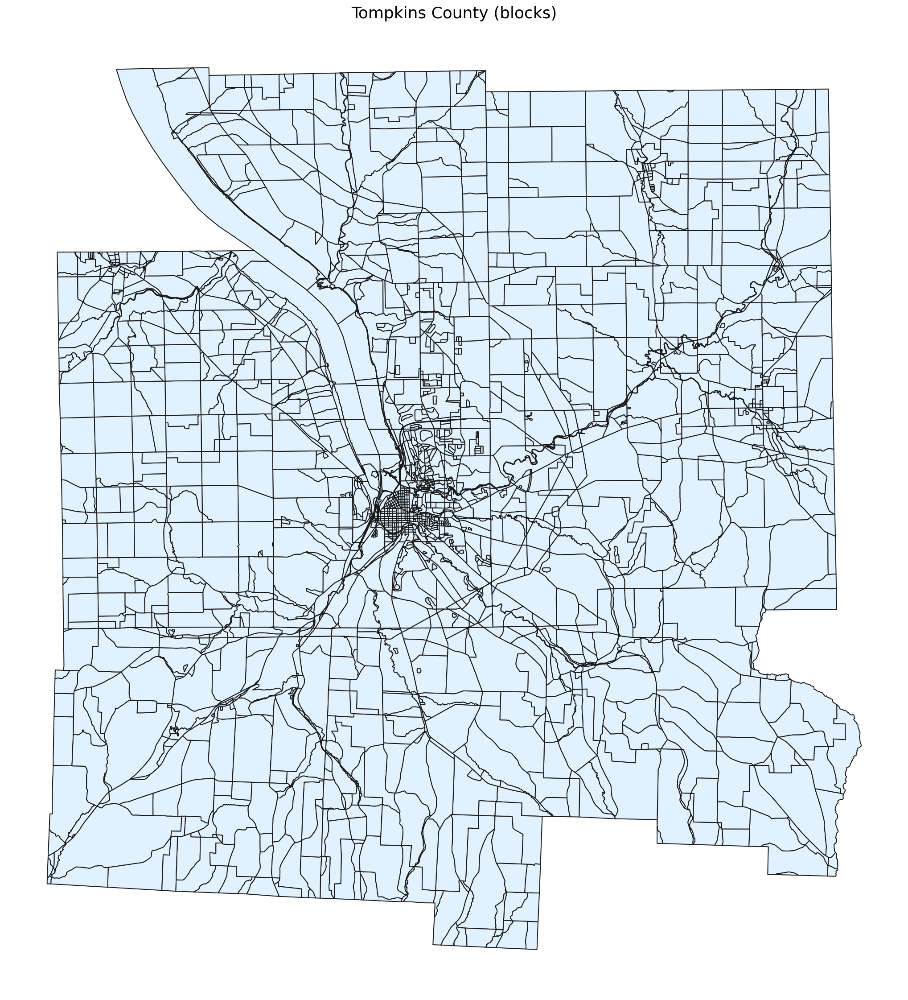

In [37]:
fig, ax = plt.subplots(figsize=(40, 20))
ax.set_title(f"{county_name} (blocks)", fontsize=18)
ax.axis('off')
county_block_gdf.plot(ax=ax, edgecolor="0.1", linewidth=1, color="#e1f1fd")
plt.axis('off')
plt.show()

### Block-level population data

In [8]:
p1_population_columns = {
    "P1_003N": "white",	      # White alone
    "P1_004N": "black",	      # Black or African American alone
    "P1_005N": "amin",        # American Indian and Alaska Native alone
    "P1_006N": "asian",       # Asian alone
    "P1_007N": "nhpi",        # Native Hawaiian and Other Pacific Islander alone
    "P1_008N": "other",       # Some Other Race alone
    "P1_009N": "two_or_more", # Two or more races
}

In [9]:
block_populations = census.pl.get(
    ("NAME", *p1_population_columns),
    geo={
        "for": "block:*",
        "in": f"county:{county_fips} state:{state_fips}",
    }
)

In [10]:
race_df = pd.DataFrame(block_populations).rename(
    columns={"NAME": "name", **p1_population_columns}
)

In [11]:
race_df["GEOID20"] = (
    race_df["state"]
    + race_df["county"]
    + race_df["tract"]
    + race_df["block"]
)
race_df = race_df.set_index("GEOID20").drop(columns=["name", "state", "county", "tract", "block"])

In [12]:
categories = list(p1_population_columns.values())

In [13]:
race_df["total"] = race_df[categories].sum(axis=1)

In [14]:
race_df

,white,black,amin,asian,nhpi,other,two_or_more,total
GEOID20,,,,,,,,
361090006004037,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
361090007002006,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
361090008001023,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
361090008002016,32.0,2.0,0.0,4.0,0.0,1.0,7.0,46.0
361090013012008,301.0,23.0,3.0,499.0,2.0,19.0,90.0,937.0
...,...,...,...,...,...,...,...,...
361090018001018,10.0,0.0,0.0,1.0,0.0,1.0,0.0,12.0
361090018001021,47.0,0.0,0.0,0.0,0.0,2.0,2.0,51.0
361090018001025,0.0,3.0,0.0,0.0,0.0,2.0,1.0,6.0


In [15]:
race_with_pcts_df = race_df.copy()

In [16]:
for col in categories:
    race_with_pcts_df[f"{col}_pct"] = (100 * race_df[col] / race_df["total"]).fillna(0)

In [17]:
race_with_pcts_df

,white,black,amin,asian,nhpi,other,two_or_more,total,white_pct,black_pct,amin_pct,asian_pct,nhpi_pct,other_pct,two_or_more_pct
GEOID20,,,,,,,,,,,,,,,
361090006004037,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
361090007002006,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
361090008001023,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
361090008002016,32.0,2.0,0.0,4.0,0.0,1.0,7.0,46.0,69.565217,4.347826,0.000000,8.695652,0.000000,2.173913,15.217391
361090013012008,301.0,23.0,3.0,499.0,2.0,19.0,90.0,937.0,32.123799,2.454642,0.320171,53.255069,0.213447,2.027748,9.605123
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361090018001018,10.0,0.0,0.0,1.0,0.0,1.0,0.0,12.0,83.333333,0.000000,0.000000,8.333333,0.000000,8.333333,0.000000
361090018001021,47.0,0.0,0.0,0.0,0.0,2.0,2.0,51.0,92.156863,0.000000,0.000000,0.000000,0.000000,3.921569,3.921569
361090018001025,0.0,3.0,0.0,0.0,0.0,2.0,1.0,6.0,0.000000,50.000000,0.000000,0.000000,0.000000,33.333333,16.666667


In [18]:
county_block_with_race_gdf = county_block_gdf.join(race_with_pcts_df)
county_block_with_race_populated_gdf = county_block_with_race_gdf[county_block_with_race_gdf.total > 0]

In [28]:
choropleth_style = dict(
    edgecolor="0.1",
    linewidth=0.2,
    cmap="Blues",
    legend=True,
    legend_kwds={'shrink': 0.4},
)

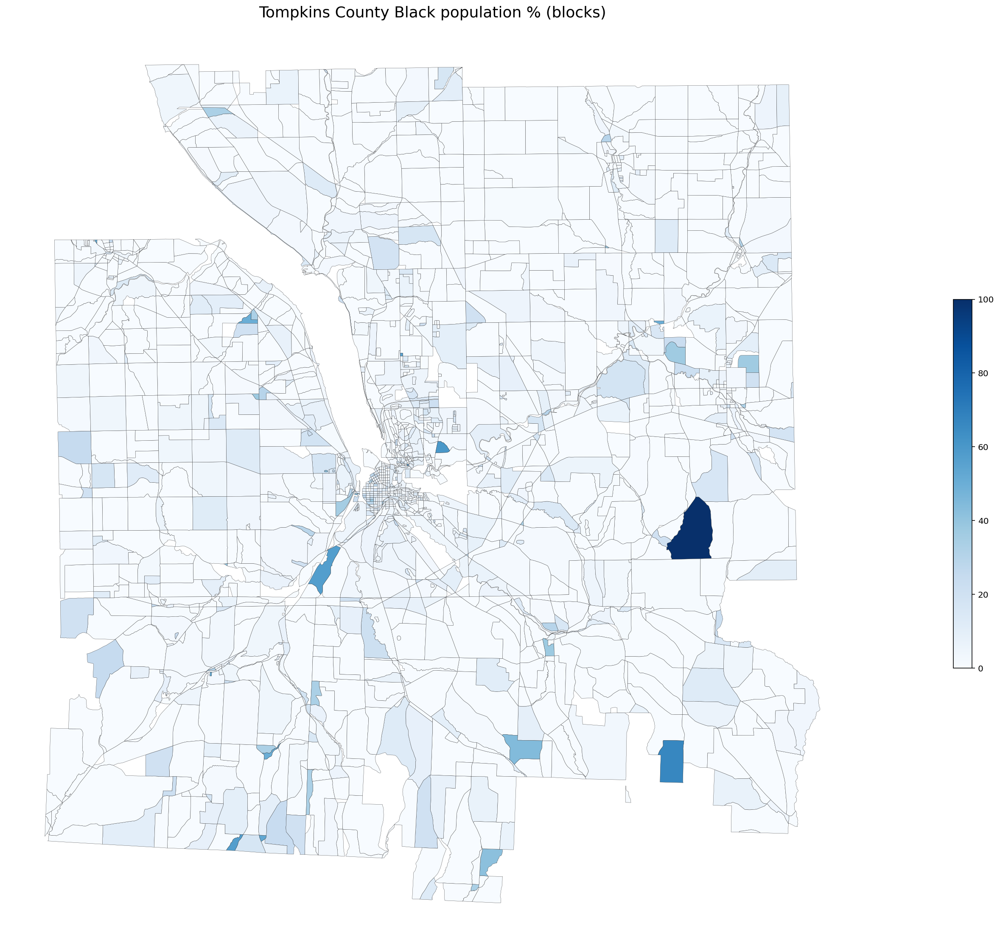

In [173]:
fig, ax = plt.subplots(figsize=(40, 20))
ax.axis('off')
ax.set_title(f"{county_name} Black population % (blocks)", fontsize=18)
county_block_with_race_populated_gdf.plot(
    ax=ax,
    column="black_pct",
    vmin=0,
    vmax=100,
    **choropleth_style,
)
plt.show()

## Scale effects: blocks vs. tracts

In [20]:
tract_gdf = gpd.read_file(f"https://www2.census.gov/geo/tiger/TIGER2024/TRACT/tl_2024_{state_fips}_tract.zip")
tract_gdf = tract_gdf.to_crs("EPSG:2263").set_index("GEOID")

In [21]:
county_tract_gdf = tract_gdf[tract_gdf.COUNTYFP == county_fips]

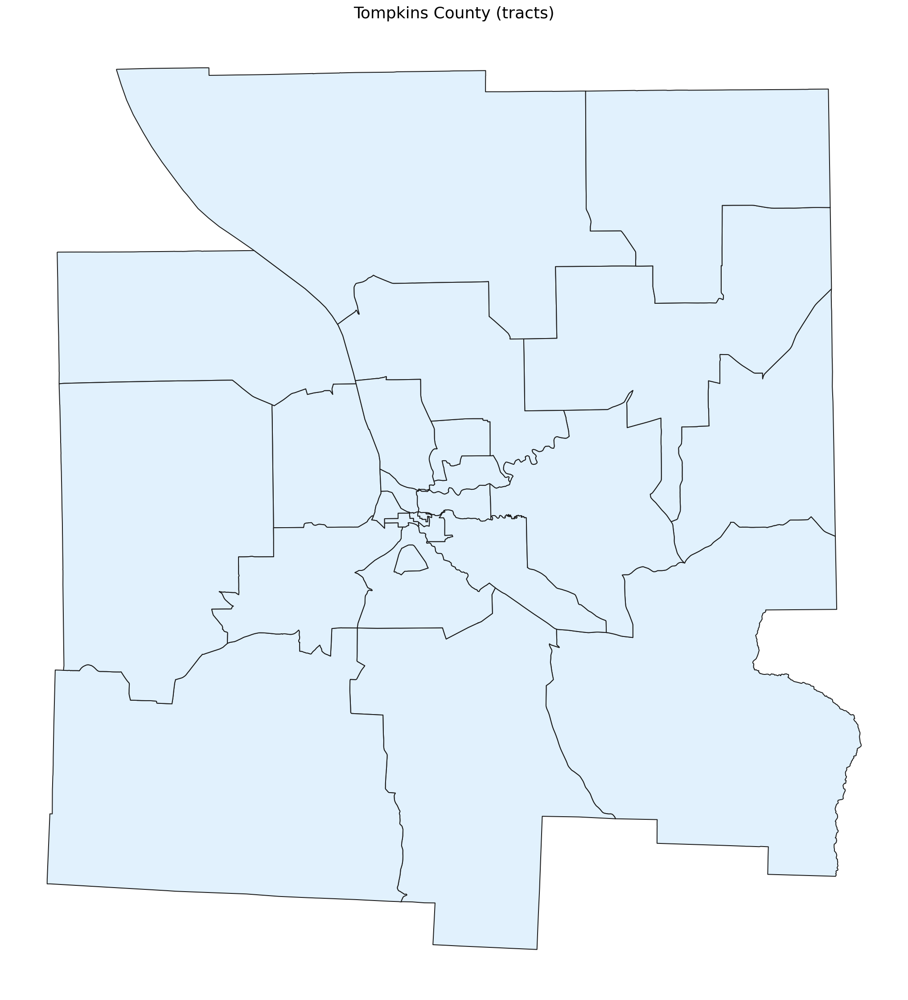

In [36]:
fig, ax = plt.subplots(figsize=(40, 20))
ax.axis('off')
ax.set_title(f"{county_name} (tracts)", fontsize=18)
county_tract_gdf.plot(ax=ax, edgecolor="0.1", linewidth=1, color="#e1f1fd")
plt.axis('off')
plt.show()

In [23]:
county_tract_gdf.iloc[0]

STATEFP                                                    36
COUNTYFP                                                  109
TRACTCE                                                001901
GEOIDFQ                                  1400000US36109001901
NAME                                                    19.01
NAMELSAD                                   Census Tract 19.01
MTFCC                                                   G5020
FUNCSTAT                                                    S
ALAND                                               153739856
AWATER                                                 291655
INTPTLAT                                          +42.3655698
INTPTLON                                         -076.3320042
geometry    POLYGON ((331480.1203243493 812865.6178898879,...
Name: 36109001901, dtype: object

In [24]:
county_block_with_race_gdf["tract"] = county_block_with_race_gdf.index.str.slice(0, 11)

In [25]:
county_tract_race_df = county_block_with_race_gdf[[*categories, "total", "tract"]].groupby("tract").sum()
county_tract_race_df

,white,black,amin,asian,nhpi,other,two_or_more,total
tract,,,,,,,,
36109000100,1244.0,141.0,5.0,391.0,0.0,84.0,199.0,2064.0
36109000201,1502.0,75.0,6.0,1324.0,3.0,92.0,335.0,3337.0
36109000202,1642.0,96.0,1.0,492.0,2.0,52.0,254.0,2539.0
36109000300,1845.0,169.0,30.0,335.0,1.0,316.0,84.0,2780.0
36109000400,3074.0,292.0,6.0,908.0,2.0,541.0,145.0,4968.0
36109000500,2616.0,289.0,23.0,1014.0,0.0,104.0,443.0,4489.0
36109000600,3793.0,145.0,22.0,950.0,1.0,132.0,372.0,5415.0
36109000700,2645.0,158.0,4.0,394.0,2.0,90.0,348.0,3641.0
36109000800,1804.0,288.0,10.0,279.0,1.0,80.0,283.0,2745.0


In [26]:
county_tract_with_race_gdf = county_tract_gdf.join(county_tract_race_df)
county_tract_with_race_gdf

,STATEFP,COUNTYFP,TRACTCE,GEOIDFQ,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,INTPTLON,geometry,white,black,amin,asian,nhpi,other,two_or_more,total
GEOID,,,,,,,,,,,,,,,,,,,,,
36109001901,36,109,001901,1400000US36109001901,19.01,Census Tract 19.01,G5020,S,153739856,291655,...,-076.3320042,"POLYGON ((331480.120 812865.618, 331969.932 81...",2651.0,68.0,13.0,74.0,3.0,43.0,253.0,3105.0
36109001902,36,109,001902,1400000US36109001902,19.02,Census Tract 19.02,G5020,S,114308238,416043,...,-076.4556047,"POLYGON ((301731.357 813572.693, 301739.883 81...",2675.0,85.0,19.0,43.0,0.0,64.0,277.0,3163.0
36109001301,36,109,001301,1400000US36109001301,13.01,Census Tract 13.01,G5020,S,1126799,13433,...,-076.4804599,"POLYGON ((312066.974 837011.730, 312177.322 83...",1904.0,99.0,6.0,1032.0,6.0,47.0,351.0,3445.0
36109001302,36,109,001302,1400000US36109001302,13.02,Census Tract 13.02,G5020,S,17935436,152189,...,-076.4373372,"POLYGON ((313348.025 834629.070, 313372.036 83...",2550.0,137.0,12.0,886.0,4.0,73.0,310.0,3972.0
36109000201,36,109,000201,1400000US36109000201,2.01,Census Tract 2.01,G5020,S,154724,0,...,-076.4862224,"POLYGON ((312000.377 838878.839, 312011.181 83...",1502.0,75.0,6.0,1324.0,3.0,92.0,335.0,3337.0
36109000202,36,109,000202,1400000US36109000202,2.02,Census Tract 2.02,G5020,S,284518,1616,...,-076.4891046,"POLYGON ((310722.845 839000.907, 310729.624 83...",1642.0,96.0,1.0,492.0,2.0,52.0,254.0,2539.0
36109000900,36,109,000900,1400000US36109000900,9,Census Tract 9,G5020,S,24651176,4093369,...,-076.5405497,"POLYGON ((289910.449 855419.662, 289955.715 85...",3239.0,311.0,15.0,185.0,1.0,109.0,341.0,4201.0
36109001200,36,109,001200,1400000US36109001200,12,Census Tract 12,G5020,S,1337369,6077,...,-076.4921665,"POLYGON ((308405.538 830159.676, 308662.450 83...",2512.0,246.0,9.0,159.0,1.0,108.0,289.0,3324.0
36109001600,36,109,001600,1400000US36109001600,16,Census Tract 16,G5020,S,67150862,8755291,...,-076.5886068,"POLYGON ((257353.348 878532.096, 257383.832 87...",3759.0,57.0,9.0,40.0,6.0,38.0,354.0,4263.0


In [27]:
for col in categories:
    county_tract_with_race_gdf[f"{col}_pct"] = (100 * county_tract_with_race_gdf[col] / county_tract_with_race_gdf["total"]).fillna(0)

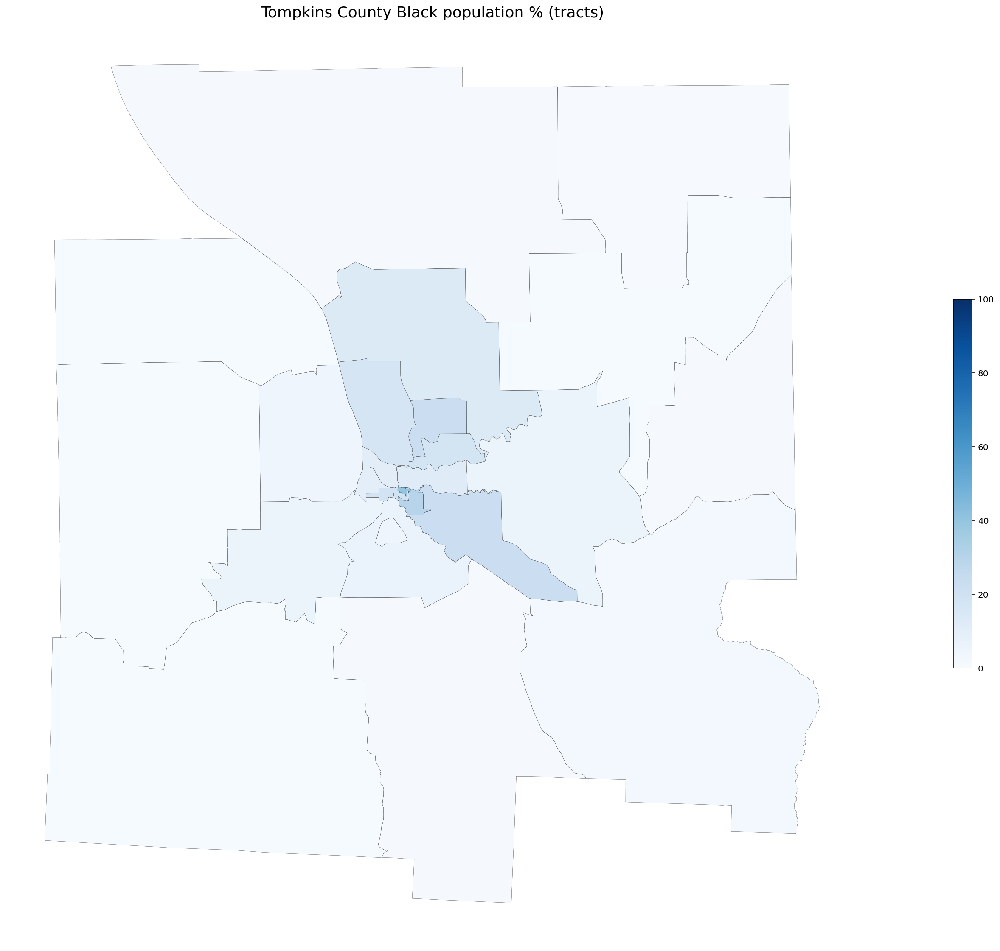

In [29]:
fig, ax = plt.subplots(figsize=(40, 20))
ax.axis('off')
ax.set_title(f"{county_name} Black population % (tracts)", fontsize=18)
county_tract_with_race_gdf.plot(
    ax=ax,
    column="asian_pct",
    vmin=0,
    vmax=100,
    **choropleth_style,
)
plt.show()

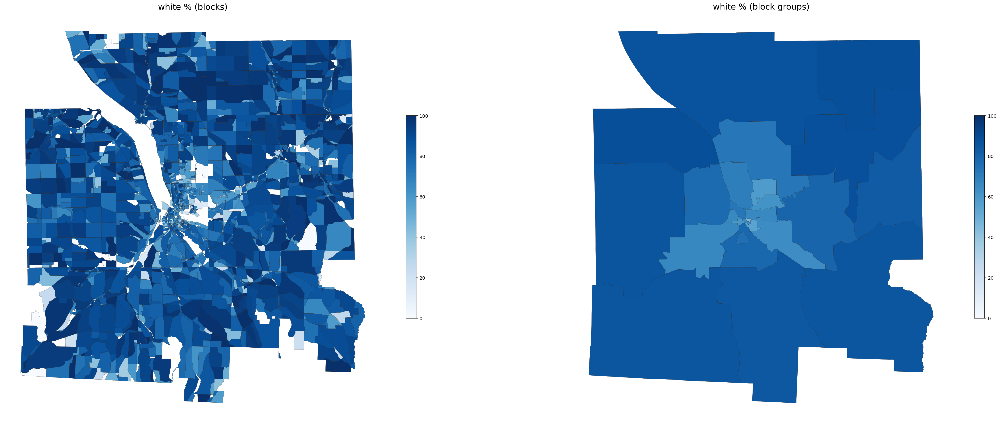

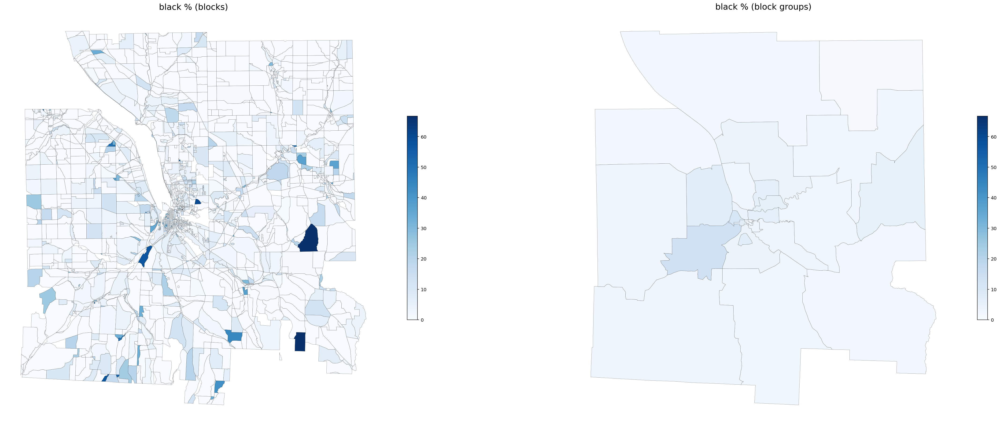

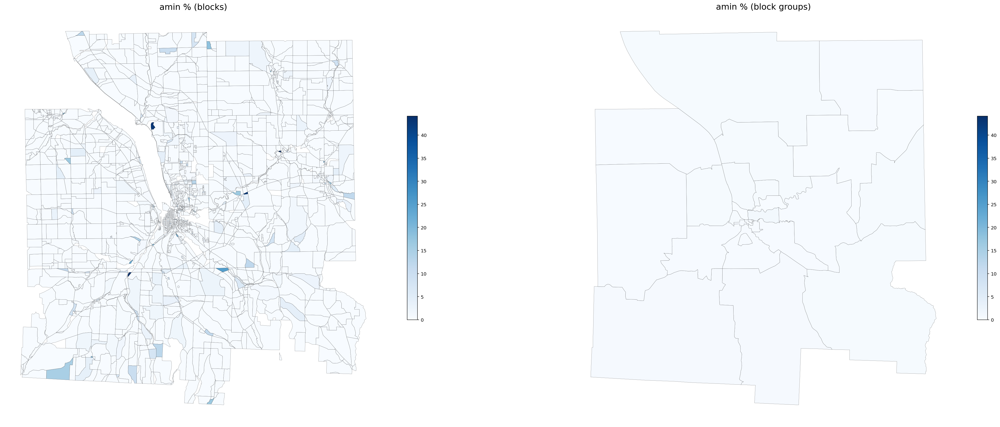

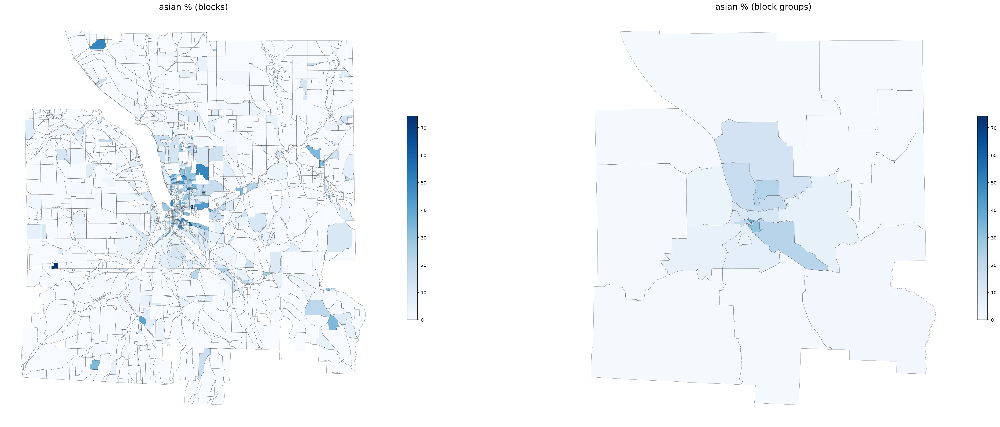

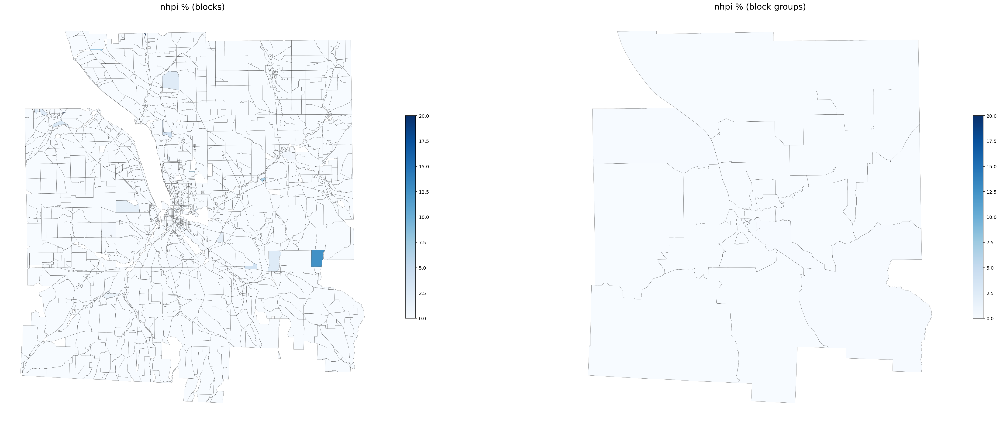

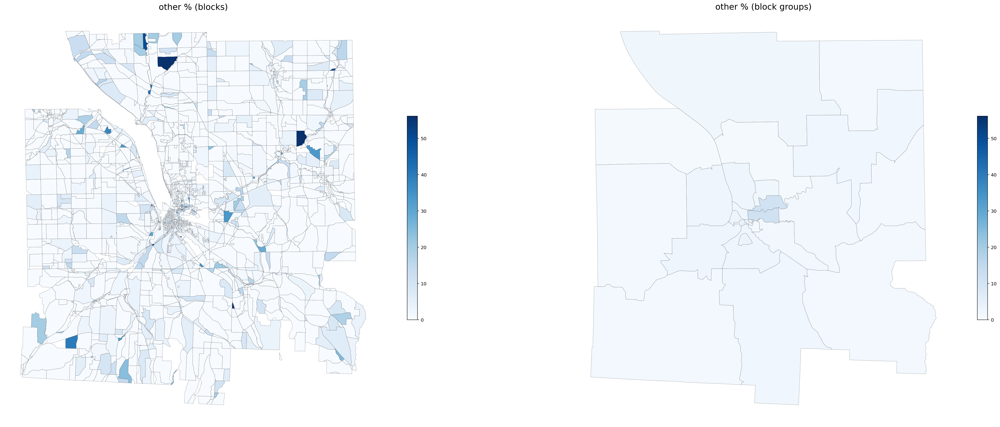

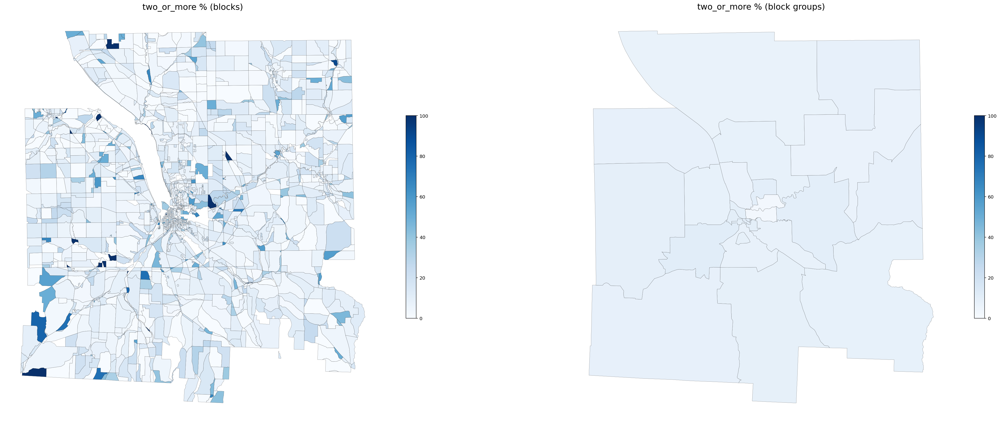

In [30]:
for col in categories:
    fig, axes = plt.subplots(1, 2, figsize=(40, 20))
    axes[0].axis('off')
    axes[0].set_title(f"{col} % (blocks)", fontsize=18)
    
    vmax = county_block_with_race_populated_gdf[f"{col}_pct"].quantile(.999)
    
    county_block_with_race_populated_gdf.plot(
        ax=axes[0],
        column=f"{col}_pct",
        vmin=0,
        vmax=vmax,
        **choropleth_style,
    )
    
    axes[1].axis('off')
    axes[1].set_title(f"{col} % (block groups)", fontsize=18)
    county_tract_with_race_gdf.plot(
        ax=axes[1],
        column=f"{col}_pct",
        vmin=0,
        vmax=vmax,
        **choropleth_style,
    )
    
    plt.show()

## Introduction to the American Community Survey (ACS)

In [31]:
# Estimate!!Median age --!!Total:	
median_age_column = "B01002_001E"

# Estimate!!Median income in the past 12 months --!!Total:	
median_income_column = "B06011_001E"

In [32]:
county_tract_acs_df = pd.DataFrame(
    census.acs5.get(
        (median_age_column, median_income_column),
        geo={
            "for": "tract:*",
            "in": f"county:{county_fips} state:{state_fips}",
        },
        year=2023,
    )
)
county_tract_acs_df["GEOID20"] = (
    county_tract_acs_df["state"]
    + county_tract_acs_df["county"]
    + county_tract_acs_df["tract"]
)
county_tract_acs_df = county_tract_acs_df.set_index("GEOID20").drop(
    columns=["state", "county", "tract"]
).rename(
    columns={
        median_age_column: "median_age",
        median_income_column: "median_income",
    }
)
county_tract_acs_df

,median_age,median_income
GEOID20,,
36109000100,32.9,37866.0
36109000201,21.5,19142.0
36109000202,22.3,18474.0
36109000300,20.0,4607.0
36109000400,19.5,5121.0
36109000500,35.3,52391.0
36109000600,36.8,49479.0
36109000700,34.0,43048.0
36109000800,35.3,37976.0


In [33]:
county_tract_with_acs_gdf = county_tract_with_race_gdf.join(county_tract_acs_df)

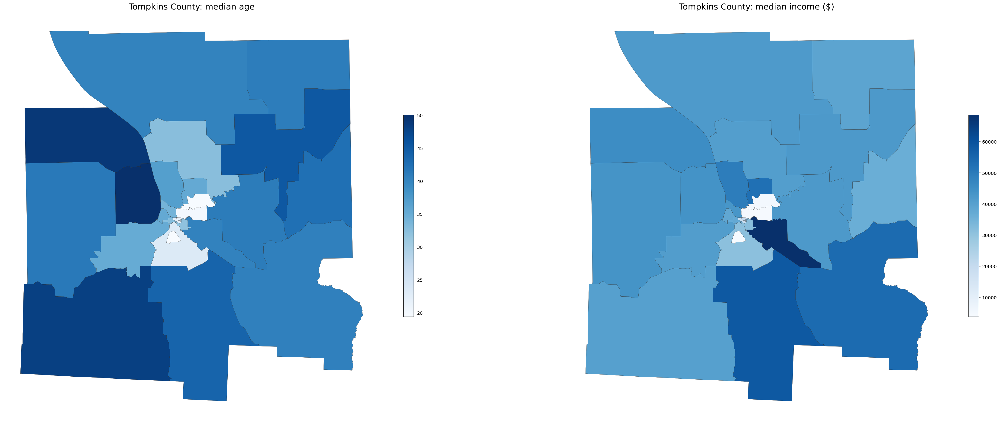

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(40, 20))
axes[0].axis('off')
axes[0].set_title(f"{county_name}: median age", fontsize=18)

county_tract_with_acs_gdf.plot(
    ax=axes[0],
    column="median_age",
    **choropleth_style,
)

axes[1].axis('off')
axes[1].set_title(f"{county_name}: median income ($)", fontsize=18)
county_tract_with_acs_gdf.plot(
    ax=axes[1],
    column="median_income",
    **choropleth_style,
)

plt.show()

## Introduction to precincts

In [124]:
ny_precinct_gdf = gpd.read_file("data/week3-NY-precincts")

In [125]:
ny_precinct_gdf

,GEOID,CountyFP,EDName,USSen_DEM,USSen_WOR,USSen_REP,USSen_CON,USSen_LAR,USSen_Writ,geometry
0,360010101001,001,Albany Ward 1 ED 1,39,6,9,0,0,0,"MULTIPOLYGON (((1038891.425 898237.779, 103888..."
1,360010101010,001,Albany Ward 1 ED 10,7,0,0,0,0,0,"POLYGON ((1048486.377 900489.622, 1048796.836 ..."
2,360010101002,001,Albany Ward 1 ED 2,146,30,21,6,1,0,"POLYGON ((1040970.913 900781.014, 1040894.602 ..."
3,360010101003,001,Albany Ward 1 ED 3,182,21,47,5,0,2,"POLYGON ((1040894.602 900719.937, 1040970.913 ..."
4,360010101004,001,Albany Ward 1 ED 4,172,22,28,4,2,0,"POLYGON ((1045046.865 900050.239, 1044979.039 ..."
...,...,...,...,...,...,...,...,...,...,...
13962,361090603002,109,City of Ithaca Ward 3 ED 2,555,147,47,7,0,2,"POLYGON ((313246.719 839085.251, 313448.412 83..."
13963,361030200241,103,Brookhaven 241,337,14,349,47,3,0,"POLYGON ((1255349.614 255179.022, 1255308.750 ..."
13964,361030200120,103,Brookhaven 120,382,24,399,47,3,1,"POLYGON ((1259376.198 255219.458, 1259391.482 ..."
13965,361030200199,103,Brookhaven 199,101,3,115,20,2,0,"POLYGON ((1276315.987 262879.744, 1276352.586 ..."


In [126]:
sen_columns = [col for col in ny_precinct_gdf if col.startswith("USSen_")]

In [127]:
ny_precinct_gdf["USSen_total"] = ny_precinct_gdf[sen_columns].sum(axis=1)
sen_columns.append("USSen_total")

In [128]:
county_precinct_gdf = ny_precinct_gdf[ny_precinct_gdf.CountyFP == county_fips]
county_precinct_gdf.geometry = county_precinct_gdf.geometry.buffer(0)

In [129]:
county_precinct_gdf

,GEOID,CountyFP,EDName,USSen_DEM,USSen_WOR,USSen_REP,USSen_CON,USSen_LAR,USSen_Writ,geometry,USSen_total
11642,361090603001,109,City of Ithaca Ward 3 ED 1,40,7,4,0,0,1,"POLYGON ((316116.132 843597.377, 316108.786 84...",52
11643,361090604001,109,City of Ithaca Ward 4,278,89,39,4,2,1,"POLYGON ((310729.832 839141.858, 310737.483 83...",413
11644,361090601003,109,City of Ithaca Ward 1 ED 3,460,164,44,10,8,0,"MULTIPOLYGON (((310883.522 837794.186, 310971....",686
11645,361090602004,109,City of Ithaca Ward 2 ED 4,273,92,15,1,3,1,"POLYGON ((310883.522 837794.186, 310762.851 83...",385
11646,361090602002,109,City of Ithaca Ward 2 ED 2,333,155,30,14,4,0,"MULTIPOLYGON (((308510.597 836881.126, 308774....",536
...,...,...,...,...,...,...,...,...,...,...,...
11699,361090800006,109,Lansing 6,351,40,55,9,4,1,"POLYGON ((312121.608 851765.399, 311633.752 85...",460
11700,361090605002,109,City of Ithaca Ward 5 ED 2,447,174,24,4,7,0,"MULTIPOLYGON (((310222.206 843887.244, 311037....",656
11701,361090605003,109,City of Ithaca Ward 5 ED 3,150,48,5,2,1,1,"MULTIPOLYGON (((311935.700 842759.939, 311917....",207
13961,361090603003,109,City of Ithaca Ward 3 ED 3,40,7,4,0,0,0,"MULTIPOLYGON (((315376.676 843484.068, 315434....",51


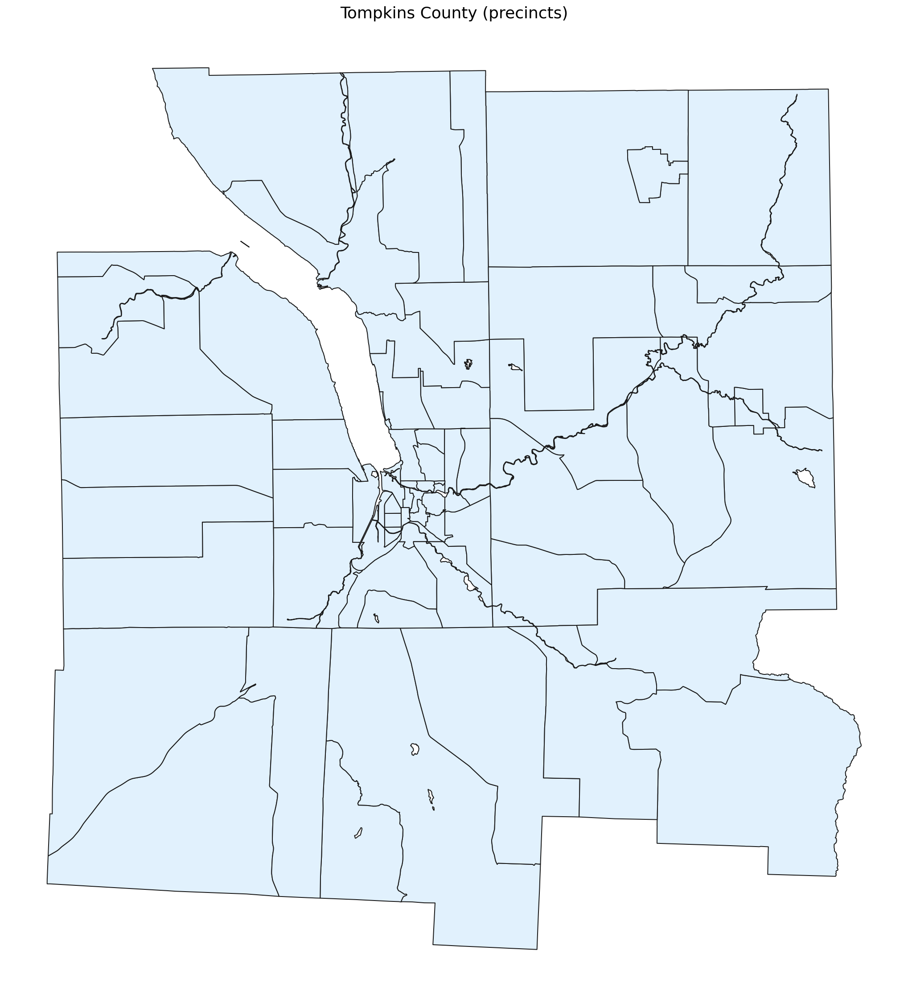

In [130]:
fig, ax = plt.subplots(figsize=(40, 20))
ax.set_title(f"{county_name} (precincts)", fontsize=18)
ax.axis('off')
county_precinct_gdf.plot(ax=ax, edgecolor="0.1", linewidth=1, color="#e1f1fd")
plt.axis('off')
plt.show()

In [131]:
block_to_precinct_assignment = maup.assign(county_block_gdf, county_precinct_gdf)
block_to_precinct_assignment = block_to_precinct_assignment[~pd.isna(block_to_precinct_assignment)].astype(int)
block_to_precinct_assignment

GEOID20
361090015002050    11689
361090019021027    11652
361090021003030    11687
361090014003014    11690
361090021002014    11688
                   ...  
361090006003010    11695
361090009001002    11665
361090022003020    11692
361090006001006    11694
361090011001008    11644
Length: 2313, dtype: int64

In [132]:
pop_weights = (
    county_block_with_race_populated_gdf["total"]
    / block_to_precinct_assignment.map(county_block_with_race_populated_gdf["total"].groupby(block_to_precinct_assignment).sum())
).fillna(0)

In [133]:
pop_weights

GEOID20
361090001001000    0.013845
361090001001001    0.000000
361090001001002    0.031815
361090001001003    0.000000
361090001001004    0.035430
                     ...   
361090023003046    0.012641
361090023003047    0.039920
361090023003048    0.176979
361090023003049    0.008649
361090023003052    0.042090
Length: 2313, dtype: float64

In [134]:
prorated_votes_df = maup.prorate(block_to_precinct_assignment, county_precinct_gdf[sen_columns], weights=pop_weights)

In [135]:
prorated_votes_df

,USSen_DEM,USSen_WOR,USSen_REP,USSen_CON,USSen_LAR,USSen_Writ,USSen_total
GEOID20,,,,,,,
361090015002050,7.065554,1.200238,4.302741,0.702026,0.067938,0.000000,13.338498
361090019021027,35.918012,8.941615,11.063354,1.288199,0.454658,0.227329,57.893168
361090021003030,10.579655,1.390275,8.206014,0.644274,0.101727,0.000000,20.921945
361090014003014,6.612111,1.358429,1.219313,0.147300,0.081833,0.024550,9.443535
361090021002014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...
361090006003010,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
361090009001002,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
361090022003020,2.878322,0.352448,2.433566,0.335664,0.075524,0.016783,6.092308


In [177]:
county_block_with_election_gdf = county_block_with_race_gdf.join(prorated_votes_df[["USSen_DEM", "USSen_total"]])
county_block_with_election_gdf["sen_dem_pct"] = (
    100 * county_block_with_election_gdf["USSen_DEM"]
    / county_block_with_election_gdf["USSen_total"]
)

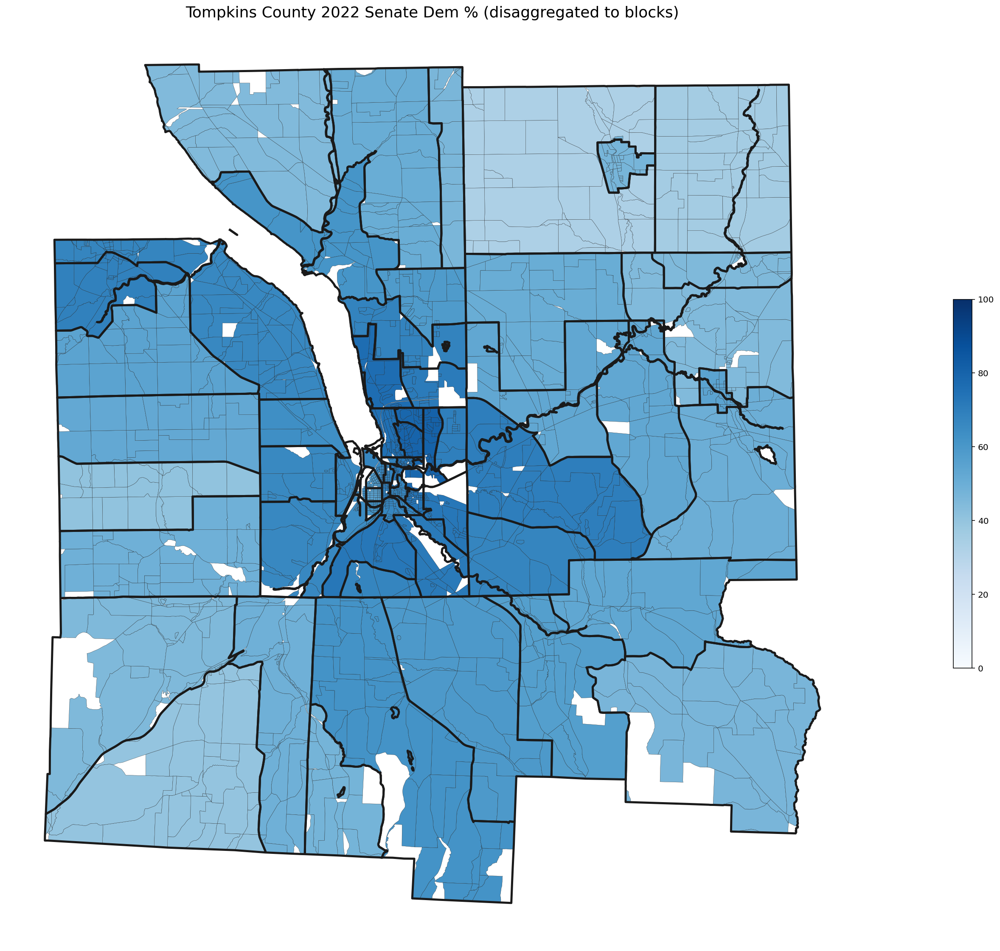

In [183]:
fig, ax = plt.subplots(figsize=(40, 20))
ax.axis('off')
ax.set_title(f"{county_name} 2022 Senate Dem % (disaggregated to blocks)", fontsize=18)
county_block_with_election_gdf[~pd.isna(county_block_with_election_gdf["sen_dem_pct"])].plot(
    ax=ax,
    column="sen_dem_pct",
    vmin=0,
    vmax=100,
    **choropleth_style,
)
county_precinct_gdf.boundary.plot(
    ax=ax,
    edgecolor="0.1",
    linewidth=2.5,
)
plt.show()

In [184]:
prorated_votes_df["tract"] = prorated_votes_df.index.str.slice(0, 11)

In [186]:
prorated_tract_votes_df = prorated_votes_df.groupby("tract")[sen_columns].sum()
prorated_tract_votes_df

,USSen_DEM,USSen_WOR,USSen_REP,USSen_CON,USSen_LAR,USSen_Writ,USSen_total
tract,,,,,,,
36109000100,354.728096,154.077900,33.779795,5.527730,3.520259,0.691358,552.325138
36109000201,135.640807,42.526190,18.125094,1.922805,0.858914,0.488022,199.561831
36109000202,187.803695,53.734439,19.919337,2.496936,0.519515,0.676302,265.150224
36109000300,133.922103,38.339924,15.352202,1.785269,0.843531,0.601387,190.844418
36109000400,386.774936,64.689484,37.468454,3.046642,0.995391,2.427165,495.402073
36109000500,1119.844911,180.653571,166.848426,12.975538,5.195501,2.592738,1488.110687
36109000600,1400.515966,210.852870,196.305123,18.576272,7.970651,2.356072,1836.576954
36109000700,919.208453,367.690847,49.259447,7.196518,9.007580,1.413272,1353.776117
36109000800,520.511847,275.019401,63.258090,10.942067,7.331509,0.120029,877.182943


In [187]:
prorated_tract_votes_df["sen_dem_pct"] = (
    100 * prorated_tract_votes_df["USSen_DEM"]
    / prorated_tract_votes_df["USSen_total"]
)

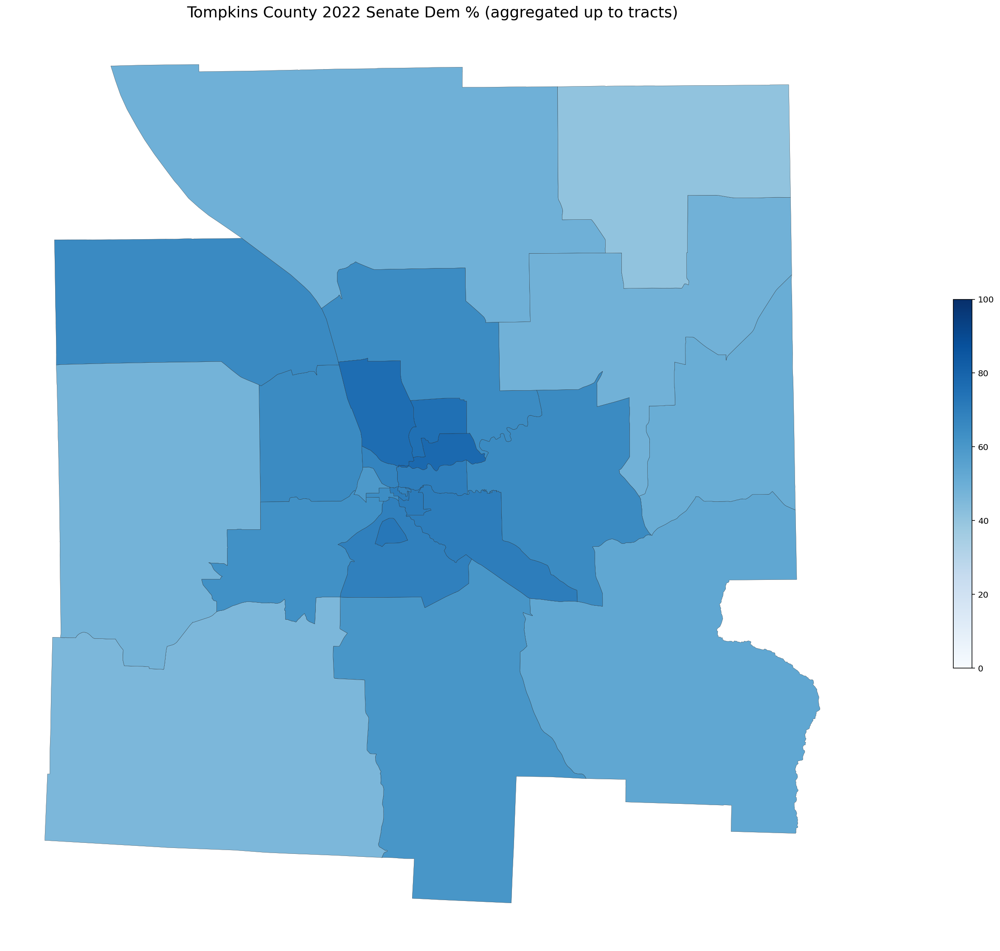

In [190]:
fig, ax = plt.subplots(figsize=(40, 20))
ax.axis('off')
ax.set_title(f"{county_name} 2022 Senate Dem % (aggregated up to tracts)", fontsize=18)
county_tract_gdf.join(prorated_tract_votes_df).plot(
    ax=ax,
    column="sen_dem_pct",
    vmin=0,
    vmax=100,
    **choropleth_style,
)
plt.show()

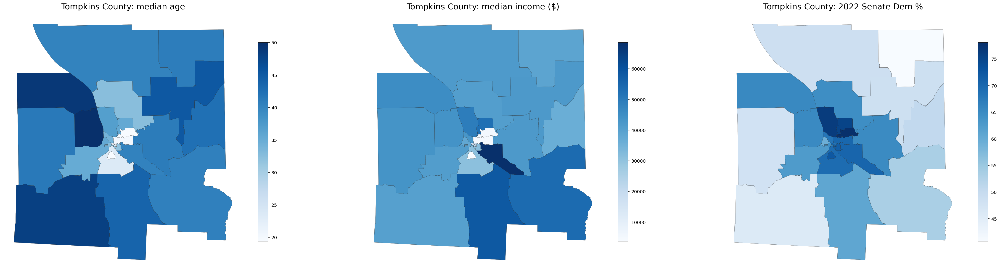

In [192]:
fig, axes = plt.subplots(1, 3, figsize=(40, 20))
axes[0].axis('off')
axes[0].set_title(f"{county_name}: median age", fontsize=18)

county_tract_with_acs_gdf.plot(
    ax=axes[0],
    column="median_age",
    **choropleth_style,
)

axes[1].axis('off')
axes[1].set_title(f"{county_name}: median income ($)", fontsize=18)
county_tract_with_acs_gdf.plot(
    ax=axes[1],
    column="median_income",
    **choropleth_style,
)

axes[2].axis('off')
axes[2].set_title(f"{county_name}: 2022 Senate Dem %", fontsize=18)
county_tract_gdf.join(prorated_tract_votes_df).plot(
    ax=axes[2],
    column="sen_dem_pct",
    **choropleth_style,
)
plt.show()